# Data centers: Adaptive Infrastructure Optimization


In [ ]:
from PIL import Image
import warnings
import pickle
import pandas as pd
from scipy.stats import truncweibull_min
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
#gurobi - need to check how to corectly use
from pathlib import Path
from typing import Dict, Union

## Analytical Problem Outline


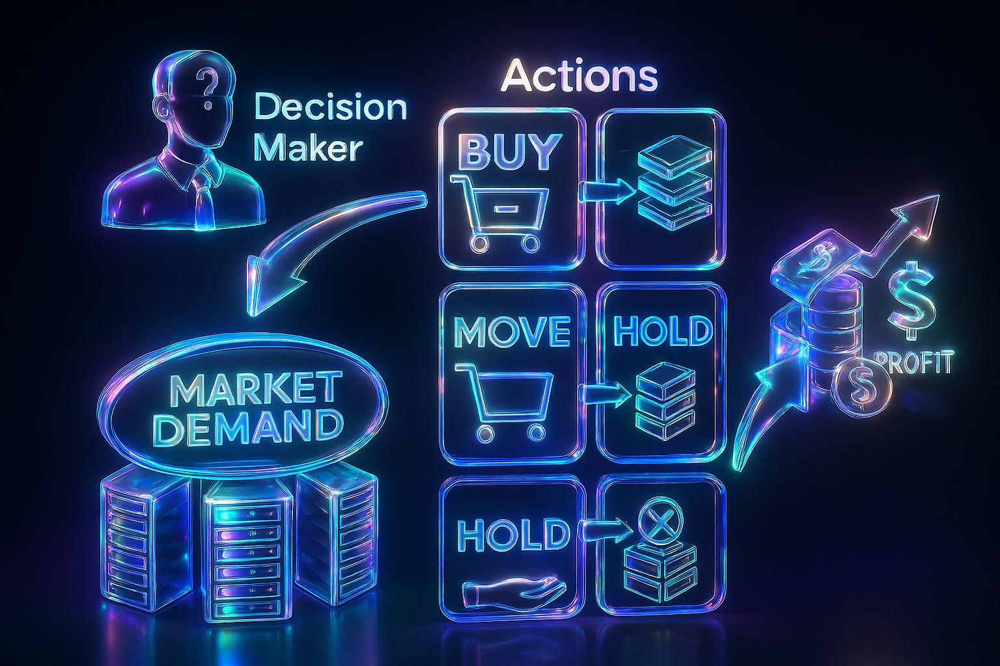

In [13]:
Image.open('pictures/project_banierre.png')

***Data centre operation management*** involves a number of difficult and intricate responsibilities.

We will study the case here of four data centres that are under the management of a single decision-maker. There can be two kinds of servers in each data centre: CPU servers and GPU servers. The decision-maker's objective is to maximise profit while staying within a crucial limitation: the slot capacity of each data centre is limited. Each discrete time step allows the decision-maker to accomplish this aim by either purchasing a server, moving a server across data centres, keeping the present server configuration, or dismissing a selected server.

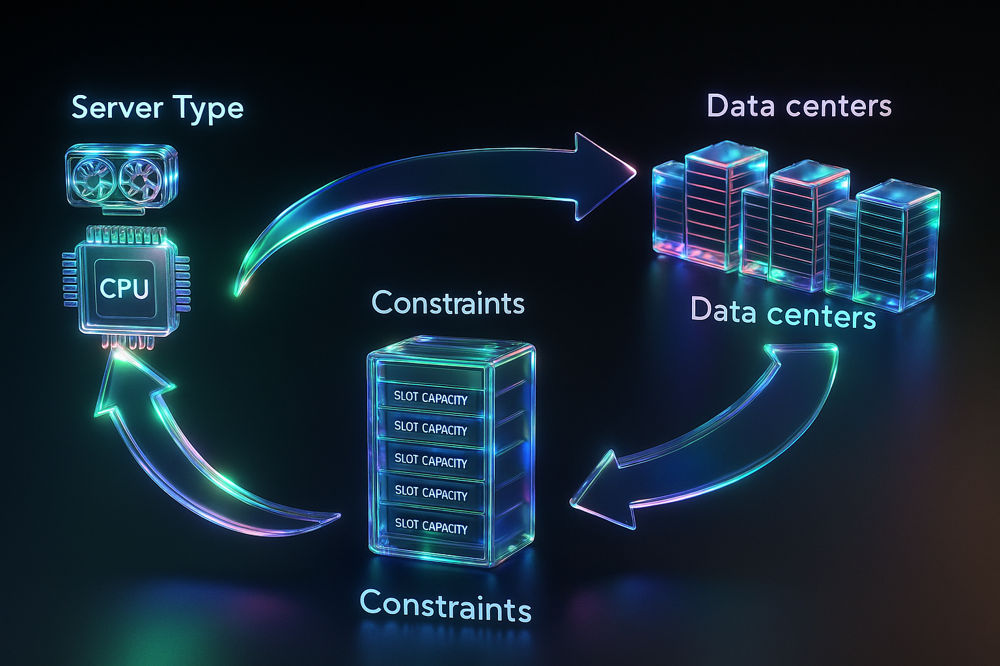

In [14]:
Image.open('pictures/constraints&resource.png')

We will use **mathematical optimisation** to simulate this decision-making problem in this notebook. The notebook's first section examines the dataset, which comprises server specs, data centre capacity, selling prices for various server generations, and demand at each time step.

The **objective function**, the **decision variables**, and the **constraints** are the three elements of a mathematical optimisation model that are introduced in the second section of the notebook. The goal of our data centre operating challenge is to maximise total profit. The actions (purchase, move, hold, and dismiss) applied to a specific number of servers are represented by the decision variables. The limitations make sure that fundamental needs are satisfied, such carrying out four operations while adhering to each data center's capacity limitations. The model will suggest how many servers of each kind should be installed in each data centre in order to **maximise profit** by identifying the best course of action at each of the 168 time steps.

In [15]:
# ─── Configuration lookup using a dict ──────────────────────────────────────
_known = {
    'datacenter_id': [
        'DC1', 'DC2', 'DC3', 'DC4'
    ],
    'actions': [
        'buy', 'hold', 'move', 'dismiss'
    ],
    'server_generation': [
        'CPU.S1', 'CPU.S2', 'CPU.S3', 'CPU.S4',
        'GPU.S1', 'GPU.S2', 'GPU.S3'
    ],
    'latency_sensitivity': [
        'high', 'medium', 'low'
    ],
    'required_columns': [
        'time_step', 'datacenter_id',
        'server_generation', 'server_id', 'action'
    ],
    'time_steps': 168,
    'datacenter_fields': [
        'datacenter_id',
        'cost_of_energy',
        'latency_sensitivity',
        'slots_capacity'
    ],
}

def get_known(key):
    """
    Retrieve one of the predefined configuration values.
    Raises KeyError if the key is not defined.
    """
    if key in _known:
        return _known[key]
    else:
        raise KeyError(f"Unknown config key: {key!r}")

In [16]:
def get_random_walk(length: int, mean: float = 0.0, std: float = 1.0) -> np.ndarray:
    """
    Generate a normalized random walk of specified length.
    This function simulates a random walk, which is a common model for dynamic scenarios in various fields, including finance and operations research.
    In other words:
    Transforms a static demand curve into a family of dynamic scenarios—essential 
    for verifying that your data-center allocation remains robust to realistic fluctuations in demand
    
    Parameters
    ----------
    length : int
        Number of steps in the random walk.
    mean : float, optional
        Mean of the Gaussian increments (default=0.0).
    std : float, optional
        Standard deviation of the Gaussian increments (default=1.0).
    
    Returns
    -------
    np.ndarray
        Array of shape (length,) representing a random walk scaled to lie in [-1, 1].
    """
    # 1) draw independent Gaussian increments
    increments = np.random.normal(loc=mean, scale=std, size=length)
    # 2) cumulative sum to form the walk
    walk = np.cumsum(increments)
    # 3) normalize to [-1, 1]
    min_val, max_val = walk.min(), walk.max()
    if max_val > min_val:
        walk = 2 * (walk - min_val) / (max_val - min_val) - 1
    else:
        # degenerate case: all equal → return zeros
        walk = np.zeros_like(walk)
    return walk

print("Random walk example:", get_random_walk(3))

Random walk example: [ 1.         -1.         -0.38534978]


In [17]:
def get_actual_demand(demand_df: pd.DataFrame) -> pd.DataFrame:
    """
    Starting from a DataFrame `demand_df` with columns
      ['time_step', 'latency_sensitivity', <one column per server_generation>],
    produce a pivoted DataFrame indexed by (time_step, server_generation)
    and with columns ['high','medium','low'] containing the perturbed integer demand.
    In other words:
    get_actual_demand transforms your clean, high-level CSV into a robust, 
    noisy demand input that your optimization engine can consume directly—and do so efficiently.
    """
    # 1) Melt into long form: one row per (time_step, latency_sensitivity, server_generation)
    long = demand_df.melt(
        id_vars=["time_step", "latency_sensitivity"],
        value_vars=get_known("server_generation"),
        var_name="server_generation",
        value_name="base_demand",
    ).assign(base_demand=lambda df: df["base_demand"].astype(float))

    # 2) For each (sg, ls) group, generate a single random walk of length T
    def perturb(group):
        T = len(group)
        # random walk increments
        increments = np.random.normal(loc=0.0, scale=2.0, size=T)
        walk = np.cumsum(increments)
        # normalize to [-1,1]
        walk = 2 * (walk - walk.min()) / np.ptp(walk) - 1
        # apply as percent adjustment
        group = group.copy()
        group["demand"] = np.floor(group["base_demand"] * (1 + walk)).astype(int)
        return group

    perturbed = (
        long
        .groupby(["server_generation", "latency_sensitivity"], group_keys=False)
        .apply(perturb)
        .drop(columns="base_demand")
    )

    # 3) Pivot into wide form
    actual = (
        perturbed
        .pivot_table(
            index=["time_step", "server_generation"],
            columns="latency_sensitivity",
            values="demand",
            fill_value=0,
        )
        .reset_index()
    )

    # 4) (Optional) remove any rows where all demands are zero
    ls_cols = get_known("latency_sensitivity")
    actual = actual.loc[actual[ls_cols].sum(axis=1) > 0].copy()

    return actual

In [18]:

def load_problem_data(base_path: str = "data"):
    """
    Load the four core CSVs for the data-center problem from a local folder.
    
    Expects files:
      - data/demand.csv
      - data/datacenters.csv
      - data/servers.csv
      - data/selling_prices.csv
    
    Returns:
        demand, datacenters, servers, selling_prices  (all pandas.DataFrame)
    """
    base = "data/"
    demand         = pd.read_csv(base / "demand.csv",         index_col=0)
    datacenters    = pd.read_csv(base / "datacenters.csv",    index_col=0)
    servers        = pd.read_csv(base / "servers.csv",         index_col=0)
    selling_prices = pd.read_csv(base / "selling_prices.csv", index_col=0)
    return demand, datacenters, servers, selling_prices


In [19]:
def compute_maintenance_cost(base_cost: float,
                             age: int,
                             max_age: int = 96,
                             scale: float = 1.5) -> float:
    """
    Compute the maintenance cost for a server of a given age.

    Uses the formula:
        cost = base_cost * [1 + (scale * age / max_age) * log2(scale * age / max_age)]

    Parameters:
    -----------
    base_cost : float
        The base maintenance cost for a brand‐new server.
    age : int
        Current age of the server (in the same time units as max_age).
    max_age : int, optional
        The age at which the scaling factor is defined (default 96).
    scale : float, optional
        A multiplicative scaling constant (default 1.5).

    Returns:
    --------
    float
        The maintenance cost, floored at zero to avoid negatives.
    """
    # Prevent division by zero or negative ages
    frac = scale * age / max_age
    # Avoid log2 of zero or negative
    if frac <= 0:
        return float(base_cost)
    # Compute the adjustment
    adjustment = frac * np.log2(frac)
    cost = base_cost * (1 + adjustment)
    # Ensure non-negative
    return max(0.0, cost)

In [20]:
# Weibull parameters (you can adjust these)
_WEIBULL_SHAPE = 1.5   # k-parameter
_WEIBULL_SCALE = 0.1   # λ-parameter

# Failure rate bounds
_FAILURE_MIN = 0.05    # at least 5% fail
_FAILURE_MAX = 0.15    # at most 15% fail

def adjust_capacity_by_failure_rate(capacity: np.ndarray,
                                    shape: float = _WEIBULL_SHAPE,
                                    scale: float = _WEIBULL_SCALE,
                                    f_min: float = _FAILURE_MIN,
                                    f_max: float = _FAILURE_MAX) -> np.ndarray:
    """
    Reduce capacity by a random failure rate drawn from 
    a Weibull(shape, scale) distribution, clamped to [f_min, f_max].
    
    Parameters
    ----------
    capacity : float or array-like
        Original capacity value(s).
    shape : float
        Weibull shape parameter k.
    scale : float
        Weibull scale parameter λ.
    f_min : float
        Minimum failure rate (e.g. 0.05 for 5%).
    f_max : float
        Maximum failure rate (e.g. 0.15 for 15%).
    
    Returns
    -------
    adjusted_capacity : same shape as `capacity`
        capacity * (1 − sampled_failure_rate).
    """
    # draw a failure rate in (0, ∞) then scale
    fr = np.random.weibull(shape, size=np.shape(capacity)) * scale
    # clamp into [f_min, f_max]
    fr = np.clip(fr, f_min, f_max)
    # adjust capacity
    return capacity * (1.0 - fr)

In [22]:
def load_wsl_lic(lic_path: Union[str, Path] = "gurobi.lic") -> Dict[str, Union[str,int]]:
    """
    Parse a Gurobi license file of form KEY=VALUE lines into a dict.
    Converts LICENSEID to int, and skips empty or commented lines.
    """
    p = Path(lic_path)
    if not p.is_file():
        raise FileNotFoundError(f"License file not found: {lic_path}")

    entries: Dict[str, Union[str,int]] = {}
    for raw in p.read_text().splitlines():
        line = raw.strip()
        # ignore blank lines and comments
        if not line or line.startswith("#"):
            continue
        if "=" not in line:
            continue
        key, val = (part.strip() for part in line.split("=", 1))
        # type‐cast LICENSEID
        entries[key] = int(val) if key.upper() == "LICENSEID" and val.isdigit() else val
    return entries

## Data Understanding


### Data center information

| **Column Name**        | **Description**                                                                                     |
|------------------------|-----------------------------------------------------------------------------------------------------|
| `datacenter_id`                   | Identifier for each datacenter (unique ID).                                                                      |
| `cost_of_energy`       | This is the electricity price per kilowatt per time-step.                          |
| `latency_sensitivity`  | This is the time it takes for data to travel from its source to the data-center and back. Latency sensitivity is divided into three categories: low, medium, and high.                   |
| `slots_capacity`       | Total number of slots available in the datacenter, which acts as a constraint on server placement. A server can occupy two or more slots.   |

In [25]:
datacenters=pd.read_csv("./data/datacenters.csv")
datacenters

,datacenter_id,cost_of_energy,latency_sensitivity,slots_capacity
0,DC1,0.25,low,25245
1,DC2,0.35,medium,15300
2,DC3,0.65,high,7020
3,DC4,0.75,high,8280


**Observations:** 

- Depending on the data center where it is located, each server will have a different **latency sensitivity** (high, medium, or low).

- Datacenters differ in how sensitive they are to latency. Higher energy expenditures are generally associated with a higher delay sensitivity. **(Higher cost_of_energy, higher latency_sensitivity)**

- Larger slot capacity is typically found in datacenters with reduced latency. **(reduced latency_sensitivity, larger slots_capacity)**

### Server Information


| **Column Name**            | **Description**                                                                                     |
|----------------------------|-----------------------------------------------------------------------------------------------------|
| `server_generation`         | This is the unique ID of a generation of servers. There are four generations of CPU servers, and three generations of GPU servers.                   |
| `server_type`               | The server type can either be a CPU or a GPU.                 |
| `release_time`              | Time-steps at which the server is available for purchase.                |
| `purchased_price`           |  This represents the price for buying the server.                      |
| `slots_size`                | This is the number of slots occupied by the server.             |
| `energy_consumption`        | This is the server energy consumption in terms of kilowatt per time-step.                   |
| `capacity`                  | The capacity is measured differently for each server type. For CPU servers, capacity is measured by the number of CPUs, while for GPU servers, it is measured by the number of GPU cards.  |
| `life_expectancy`           | This is the maximum number of time-steps that the server can be used before to be dismissed.   |
| `cost_of_moving`            | This is the cost required to move a server from one data-center to another.            |
| `average_maintenance_fee`   | This is the average cost to maintain the server at each time-step which is different for each server generation.                             |


In [24]:
servers= pd.read_csv("./data/servers.csv")
servers

,server_generation,server_type,release_time,purchase_price,slots_size,energy_consumption,capacity,life_expectancy,cost_of_moving,average_maintenance_fee
0,CPU.S1,CPU,"[1,60]",15000,2,400,60,96,1000,288
1,CPU.S2,CPU,"[37,96]",16000,2,460,75,96,1000,308
2,CPU.S3,CPU,"[73,132]",19500,2,800,120,96,1000,375
3,CPU.S4,CPU,"[109,168]",22000,2,920,160,96,1000,423
4,GPU.S1,GPU,"[1,72]",120000,4,3000,8,96,1000,2310
5,GPU.S2,GPU,"[49,120]",140000,4,3000,8,96,1000,2695
6,GPU.S3,GPU,"[97,168]",160000,4,4200,8,96,1000,3080
